# NLP Tweets

In [1]:
import nltk
import pandas as pd
pd.set_option('future.no_silent_downcasting', True)

## Loading data

In [2]:
data = pd.read_csv('data/twitter_training.csv', names=['id', 'entity', 'sentiment', 'tweet'])

In [3]:
data.head()

,id,entity,sentiment,tweet
0,2401,Borderlands,Positive,im getting on borderlands and i will murder yo...
1,2401,Borderlands,Positive,I am coming to the borders and I will kill you...
2,2401,Borderlands,Positive,im getting on borderlands and i will kill you ...
3,2401,Borderlands,Positive,im coming on borderlands and i will murder you...
4,2401,Borderlands,Positive,im getting on borderlands 2 and i will murder ...


## Filter Negative and Positive Tweets

In [4]:
filter_pos_neg = (data['sentiment'] == 'Positive') | (data['sentiment'] == 'Negative')
data = data[filter_pos_neg]

In [5]:
data['sentiment'] = data['sentiment'].map({'Positive': 1, 'Negative': 0})

In [6]:
data = data.dropna()

## CountVectorizer

In [7]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(max_features=50)
tweets_vec = vectorizer.fit_transform(data['tweet'])
tweets_vec

<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 218712 stored elements and shape (43013, 50)>

## Tweets Bag of Words

In [8]:
tweet_df = pd.DataFrame.sparse.from_spmatrix(tweets_vec, columns=vectorizer.get_feature_names_out())
tweet_df

,about,all,and,are,as,at,be,but,can,com,...,to,twitter,was,we,what,when,why,with,you,your
0,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,0,1,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
2,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43008,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
43009,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
43010,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
43011,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## WordCloud of Tweets

In [9]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

all_tweets = ' '.join(data['tweet'])
all_tweets

'im getting on borderlands and i will murder you all , I am coming to the borders and I will kill you all, im getting on borderlands and i will kill you all, im coming on borderlands and i will murder you all, im getting on borderlands 2 and i will murder you me all, im getting into borderlands and i can murder you all, So I spent a few hours making something for fun. . . If you don\'t know I am a HUGE @Borderlands fan and Maya is one of my favorite characters. So I decided to make myself a wallpaper for my PC. . Here is the original image versus the creation I made :) Enjoy! pic.twitter.com/mLsI5wf9Jg So I spent a couple of hours doing something for fun... If you don\'t know that I\'m a huge @ Borderlands fan and Maya is one of my favorite characters, I decided to make a wallpaper for my PC.. Here\'s the original picture compared to the creation I made:) Have fun! pic.twitter.com / mLsI5wf9Jg So I spent a few hours doing something for fun... If you don\'t know I\'m a HUGE @ Borderland

(np.float64(-0.5), np.float64(399.5), np.float64(199.5), np.float64(-0.5))

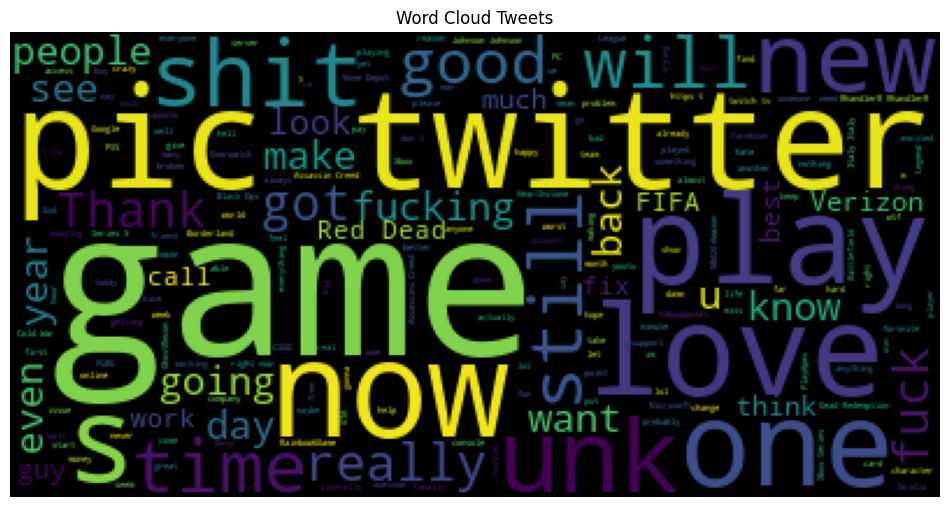

In [10]:
wordcloud = WordCloud().generate(all_tweets)
plt.figure(figsize=(12, 8))
plt.title('Word Cloud Tweets')
plt.imshow(wordcloud)
plt.axis("off")

## Word Cloud Postive Tweets

In [11]:
filter_pos = (data['sentiment'] == 1)
all_tweets_pos = ' '.join(data[filter_pos]['tweet'])
all_tweets_pos

'im getting on borderlands and i will murder you all , I am coming to the borders and I will kill you all, im getting on borderlands and i will kill you all, im coming on borderlands and i will murder you all, im getting on borderlands 2 and i will murder you me all, im getting into borderlands and i can murder you all, So I spent a few hours making something for fun. . . If you don\'t know I am a HUGE @Borderlands fan and Maya is one of my favorite characters. So I decided to make myself a wallpaper for my PC. . Here is the original image versus the creation I made :) Enjoy! pic.twitter.com/mLsI5wf9Jg So I spent a couple of hours doing something for fun... If you don\'t know that I\'m a huge @ Borderlands fan and Maya is one of my favorite characters, I decided to make a wallpaper for my PC.. Here\'s the original picture compared to the creation I made:) Have fun! pic.twitter.com / mLsI5wf9Jg So I spent a few hours doing something for fun... If you don\'t know I\'m a HUGE @ Borderland

(np.float64(-0.5), np.float64(399.5), np.float64(199.5), np.float64(-0.5))

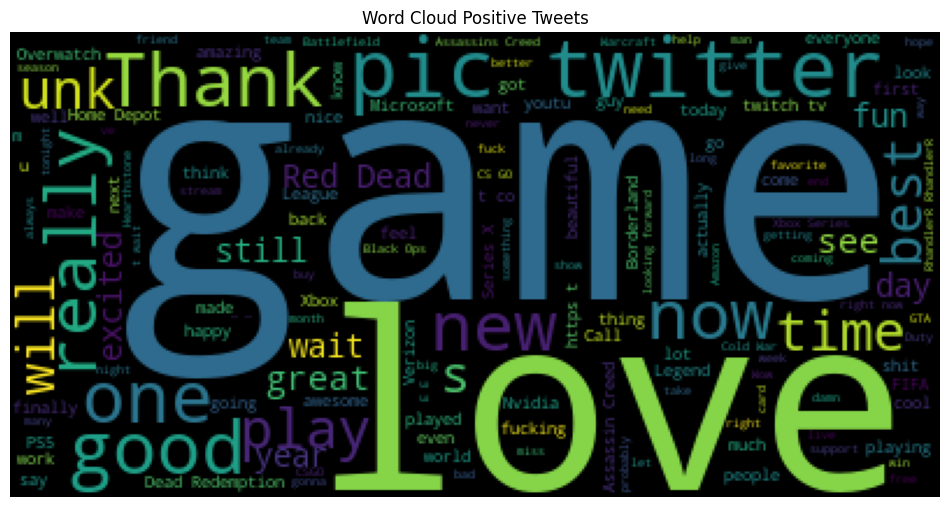

In [12]:
wordcloud = WordCloud().generate(all_tweets_pos)
plt.figure(figsize=(12, 8))
plt.title('Word Cloud Positive Tweets')
plt.imshow(wordcloud)
plt.axis("off")

## Word Cloud Negative Tweets

In [13]:
filter_neg = (data['sentiment'] == 0)
all_tweets_neg = ' '.join(data[filter_neg]['tweet'])
all_tweets_neg

'the biggest dissappoinment in my life came out a year ago fuck borderlands 3 The biggest disappointment of my life came a year ago. The biggest disappointment of my life came a year ago. the biggest dissappoinment in my life coming out a year ago fuck borderlands 3 For the biggest male dissappoinment in my life came hanging out a year time ago fuck borderlands 3 the biggest dissappoinment in my life came back last year ago fuck borderlands last Man Gearbox really needs to fix this dissapointing drops in the new Borderlands 3 DLC cant be fine to farm bosses on Mayhem 10 to get 1 legendary drop while anywhere else i get 6-10 drops. . Really sucks alot Man Gearbox really needs to fix these disappointing drops in the new Borderlands 3 DLC for farm bosses on Mayhem 10 to get a legendary drop, while I get 6-10 drops elsewhere. Man Gearbox really needs to fix this disssapointing drops in the new Borderlands 3 DLC cant be fine to farm bosses on Mayhem 10 to get 1 legendary drop while elsewher

(np.float64(-0.5), np.float64(399.5), np.float64(199.5), np.float64(-0.5))

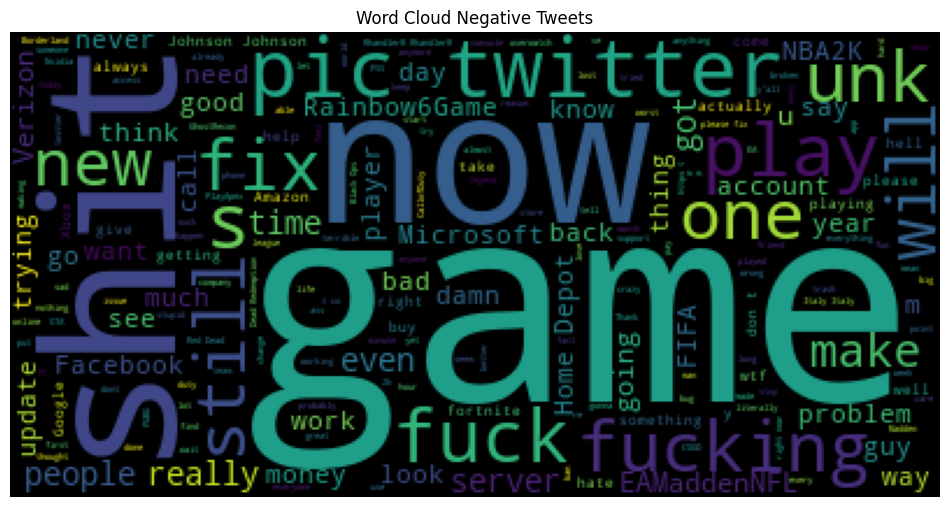

In [14]:
wordcloud = WordCloud().generate(all_tweets_neg)
plt.figure(figsize=(12, 8))
plt.title('Word Cloud Negative Tweets')
plt.imshow(wordcloud)
plt.axis("off")

## Tokenize Tweets

In [15]:
nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to C:\Users\Victor
[nltk_data]    |     Dantas\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to C:\Users\Victor
[nltk_data]    |     Dantas\AppData\Roaming\nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     C:\Users\Victor
[nltk_data]    |     Dantas\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_eng to
[nltk_data]    |     C:\Users\Victor
[nltk_data]    |     Dantas\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_eng is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagge

True

In [16]:
from nltk import tokenize

tokenizer = tokenize.WhitespaceTokenizer()
data['tweet_tokens'] = data['tweet'].apply(tokenizer.tokenize)

data

,id,entity,sentiment,tweet,tweet_tokens
0,2401,Borderlands,1,im getting on borderlands and i will murder yo...,"[im, getting, on, borderlands, and, i, will, m..."
1,2401,Borderlands,1,I am coming to the borders and I will kill you...,"[I, am, coming, to, the, borders, and, I, will..."
2,2401,Borderlands,1,im getting on borderlands and i will kill you ...,"[im, getting, on, borderlands, and, i, will, k..."
3,2401,Borderlands,1,im coming on borderlands and i will murder you...,"[im, coming, on, borderlands, and, i, will, mu..."
4,2401,Borderlands,1,im getting on borderlands 2 and i will murder ...,"[im, getting, on, borderlands, 2, and, i, will..."
...,...,...,...,...,...
74677,9200,Nvidia,1,Just realized that the Windows partition of my...,"[Just, realized, that, the, Windows, partition..."
74678,9200,Nvidia,1,Just realized that my Mac window partition is ...,"[Just, realized, that, my, Mac, window, partit..."
74679,9200,Nvidia,1,Just realized the windows partition of my Mac ...,"[Just, realized, the, windows, partition, of, ..."
74680,9200,Nvidia,1,Just realized between the windows partition of...,"[Just, realized, between, the, windows, partit..."


## Verifying Frequence of Words

In [17]:
from nltk import FreqDist

tokens_all_tweets = tokenizer.tokenize(all_tweets)
freq_dist = FreqDist(tokens_all_tweets)
freq_dist

FreqDist({'the': 22656, 'I': 16643, 'to': 16186, 'and': 14426, 'a': 12529, 'is': 10507, 'of': 10434, 'for': 8184, 'in': 7905, '@': 7021, ...})

In [18]:
dist_freq_tokens = pd.DataFrame({'Word': list(freq_dist.keys()), 'Frequency': list(freq_dist.values())})
dist_freq_tokens.nlargest(10, 'Frequency')

,Word,Frequency
15,the,22656
11,I,16643
14,to,16186
4,and,14426
25,a,12529
40,is,10507
42,of,10434
30,for,8184
84,in,7905
66,@,7021


## Removing Stop Words
- Remove stopwords with nltk.copus.stopwords

In [19]:
stop_words_en = nltk.corpus.stopwords.words('english')

words_processed = []
for tweet in data['tweet_tokens']:
   clean_tokens = [word for word in tweet if word not in stop_words_en]
   words_processed.append(clean_tokens)
data['tweet_tokens_clean'] = words_processed
data['tweet_clean'] = [' '.join(tokens) for tokens in data['tweet_tokens_clean']]

data

,id,entity,sentiment,tweet,tweet_tokens,tweet_tokens_clean,tweet_clean
0,2401,Borderlands,1,im getting on borderlands and i will murder yo...,"[im, getting, on, borderlands, and, i, will, m...","[im, getting, borderlands, murder, ,]","im getting borderlands murder ,"
1,2401,Borderlands,1,I am coming to the borders and I will kill you...,"[I, am, coming, to, the, borders, and, I, will...","[I, coming, borders, I, kill, all,]","I coming borders I kill all,"
2,2401,Borderlands,1,im getting on borderlands and i will kill you ...,"[im, getting, on, borderlands, and, i, will, k...","[im, getting, borderlands, kill, all,]","im getting borderlands kill all,"
3,2401,Borderlands,1,im coming on borderlands and i will murder you...,"[im, coming, on, borderlands, and, i, will, mu...","[im, coming, borderlands, murder, all,]","im coming borderlands murder all,"
4,2401,Borderlands,1,im getting on borderlands 2 and i will murder ...,"[im, getting, on, borderlands, 2, and, i, will...","[im, getting, borderlands, 2, murder, all,]","im getting borderlands 2 murder all,"
...,...,...,...,...,...,...,...
74677,9200,Nvidia,1,Just realized that the Windows partition of my...,"[Just, realized, that, the, Windows, partition...","[Just, realized, Windows, partition, Mac, like...",Just realized Windows partition Mac like 6 yea...
74678,9200,Nvidia,1,Just realized that my Mac window partition is ...,"[Just, realized, that, my, Mac, window, partit...","[Just, realized, Mac, window, partition, 6, ye...",Just realized Mac window partition 6 years beh...
74679,9200,Nvidia,1,Just realized the windows partition of my Mac ...,"[Just, realized, the, windows, partition, of, ...","[Just, realized, windows, partition, Mac, 6, y...",Just realized windows partition Mac 6 years be...
74680,9200,Nvidia,1,Just realized between the windows partition of...,"[Just, realized, between, the, windows, partit...","[Just, realized, windows, partition, Mac, like...",Just realized windows partition Mac like 6 yea...


## Removing Punctuation
- Tokenize punctuation with WordPunctTokenizer and remove non alpha

In [20]:
from nltk.tokenize import WordPunctTokenizer
tokenizer = WordPunctTokenizer()

tokens_stemmed = []
for tweet in data['tweet']:
    tokens = tokenizer.tokenize(tweet)
    tokens_clean = [token for token in tokens if token.isalpha() and token not in stop_words_en]
    tokens_stemmed.append(tokens_clean)

data['tweet_tokens_clean'] = tokens_stemmed
data['tweet_clean'] = [' '.join(tokens) for tokens in data['tweet_tokens_clean']]

data

,id,entity,sentiment,tweet,tweet_tokens,tweet_tokens_clean,tweet_clean
0,2401,Borderlands,1,im getting on borderlands and i will murder yo...,"[im, getting, on, borderlands, and, i, will, m...","[im, getting, borderlands, murder]",im getting borderlands murder
1,2401,Borderlands,1,I am coming to the borders and I will kill you...,"[I, am, coming, to, the, borders, and, I, will...","[I, coming, borders, I, kill]",I coming borders I kill
2,2401,Borderlands,1,im getting on borderlands and i will kill you ...,"[im, getting, on, borderlands, and, i, will, k...","[im, getting, borderlands, kill]",im getting borderlands kill
3,2401,Borderlands,1,im coming on borderlands and i will murder you...,"[im, coming, on, borderlands, and, i, will, mu...","[im, coming, borderlands, murder]",im coming borderlands murder
4,2401,Borderlands,1,im getting on borderlands 2 and i will murder ...,"[im, getting, on, borderlands, 2, and, i, will...","[im, getting, borderlands, murder]",im getting borderlands murder
...,...,...,...,...,...,...,...
74677,9200,Nvidia,1,Just realized that the Windows partition of my...,"[Just, realized, that, the, Windows, partition...","[Just, realized, Windows, partition, Mac, like...",Just realized Windows partition Mac like years...
74678,9200,Nvidia,1,Just realized that my Mac window partition is ...,"[Just, realized, that, my, Mac, window, partit...","[Just, realized, Mac, window, partition, years...",Just realized Mac window partition years behin...
74679,9200,Nvidia,1,Just realized the windows partition of my Mac ...,"[Just, realized, the, windows, partition, of, ...","[Just, realized, windows, partition, Mac, year...",Just realized windows partition Mac years behi...
74680,9200,Nvidia,1,Just realized between the windows partition of...,"[Just, realized, between, the, windows, partit...","[Just, realized, windows, partition, Mac, like...",Just realized windows partition Mac like years...


## Uniforming tweets
- Text to lower case

In [21]:
tokens_stemmed = []
for tweet in data['tweet']:
    tweet.lower()
    tokens = tokenizer.tokenize(tweet)
    tokens_clean = [token for token in tokens if token.isalpha() and token not in stop_words_en]
    tokens_stemmed.append(tokens_clean)

data['tweet_tokens_clean'] = tokens_stemmed
data['tweet_clean'] = [' '.join(tokens) for tokens in data['tweet_tokens_clean']]

data

,id,entity,sentiment,tweet,tweet_tokens,tweet_tokens_clean,tweet_clean
0,2401,Borderlands,1,im getting on borderlands and i will murder yo...,"[im, getting, on, borderlands, and, i, will, m...","[im, getting, borderlands, murder]",im getting borderlands murder
1,2401,Borderlands,1,I am coming to the borders and I will kill you...,"[I, am, coming, to, the, borders, and, I, will...","[I, coming, borders, I, kill]",I coming borders I kill
2,2401,Borderlands,1,im getting on borderlands and i will kill you ...,"[im, getting, on, borderlands, and, i, will, k...","[im, getting, borderlands, kill]",im getting borderlands kill
3,2401,Borderlands,1,im coming on borderlands and i will murder you...,"[im, coming, on, borderlands, and, i, will, mu...","[im, coming, borderlands, murder]",im coming borderlands murder
4,2401,Borderlands,1,im getting on borderlands 2 and i will murder ...,"[im, getting, on, borderlands, 2, and, i, will...","[im, getting, borderlands, murder]",im getting borderlands murder
...,...,...,...,...,...,...,...
74677,9200,Nvidia,1,Just realized that the Windows partition of my...,"[Just, realized, that, the, Windows, partition...","[Just, realized, Windows, partition, Mac, like...",Just realized Windows partition Mac like years...
74678,9200,Nvidia,1,Just realized that my Mac window partition is ...,"[Just, realized, that, my, Mac, window, partit...","[Just, realized, Mac, window, partition, years...",Just realized Mac window partition years behin...
74679,9200,Nvidia,1,Just realized the windows partition of my Mac ...,"[Just, realized, the, windows, partition, of, ...","[Just, realized, windows, partition, Mac, year...",Just realized windows partition Mac years behi...
74680,9200,Nvidia,1,Just realized between the windows partition of...,"[Just, realized, between, the, windows, partit...","[Just, realized, windows, partition, Mac, like...",Just realized windows partition Mac like years...


## Stemming Data
- Extract word radical

In [22]:
from nltk.stem import SnowballStemmer

stemmer = SnowballStemmer('english')

tokens_stemmed = []
for tokens in data['tweet_tokens_clean']:
    tokens = [stemmer.stem(token) for token in tokens]
    tokens_stemmed.append(tokens)

data['tweet_tokens_stem'] = tokens_stemmed
data['tweet_stem'] = [' '.join(tokens) for tokens in data['tweet_tokens_stem']]

data

,id,entity,sentiment,tweet,tweet_tokens,tweet_tokens_clean,tweet_clean,tweet_tokens_stem,tweet_stem
0,2401,Borderlands,1,im getting on borderlands and i will murder yo...,"[im, getting, on, borderlands, and, i, will, m...","[im, getting, borderlands, murder]",im getting borderlands murder,"[im, get, borderland, murder]",im get borderland murder
1,2401,Borderlands,1,I am coming to the borders and I will kill you...,"[I, am, coming, to, the, borders, and, I, will...","[I, coming, borders, I, kill]",I coming borders I kill,"[i, come, border, i, kill]",i come border i kill
2,2401,Borderlands,1,im getting on borderlands and i will kill you ...,"[im, getting, on, borderlands, and, i, will, k...","[im, getting, borderlands, kill]",im getting borderlands kill,"[im, get, borderland, kill]",im get borderland kill
3,2401,Borderlands,1,im coming on borderlands and i will murder you...,"[im, coming, on, borderlands, and, i, will, mu...","[im, coming, borderlands, murder]",im coming borderlands murder,"[im, come, borderland, murder]",im come borderland murder
4,2401,Borderlands,1,im getting on borderlands 2 and i will murder ...,"[im, getting, on, borderlands, 2, and, i, will...","[im, getting, borderlands, murder]",im getting borderlands murder,"[im, get, borderland, murder]",im get borderland murder
...,...,...,...,...,...,...,...,...,...
74677,9200,Nvidia,1,Just realized that the Windows partition of my...,"[Just, realized, that, the, Windows, partition...","[Just, realized, Windows, partition, Mac, like...",Just realized Windows partition Mac like years...,"[just, realiz, window, partit, mac, like, year...",just realiz window partit mac like year behind...
74678,9200,Nvidia,1,Just realized that my Mac window partition is ...,"[Just, realized, that, my, Mac, window, partit...","[Just, realized, Mac, window, partition, years...",Just realized Mac window partition years behin...,"[just, realiz, mac, window, partit, year, behi...",just realiz mac window partit year behind nvid...
74679,9200,Nvidia,1,Just realized the windows partition of my Mac ...,"[Just, realized, the, windows, partition, of, ...","[Just, realized, windows, partition, Mac, year...",Just realized windows partition Mac years behi...,"[just, realiz, window, partit, mac, year, behi...",just realiz window partit mac year behind nvid...
74680,9200,Nvidia,1,Just realized between the windows partition of...,"[Just, realized, between, the, windows, partit...","[Just, realized, windows, partition, Mac, like...",Just realized windows partition Mac like years...,"[just, realiz, window, partit, mac, like, year...",just realiz window partit mac like year behind...


## TF-IDF Vectorizer
- Give weights to sentence tokens

In [23]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(lowercase=False, max_features=100)

tweet_stem_vec = vectorizer.fit_transform(data['tweet_stem'])
tweet_stem_df = pd.DataFrame(tweet_stem_vec.toarray(), columns=vectorizer.get_feature_names_out())
tweet_stem_df

,actual,also,amaz,amazon,and,assassin,back,bad,best,borderland,...,verizon,wait,want,watch,whi,work,would,xbox,year,you
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.800252,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.800252,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.702439,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.800252,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43008,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.577241,0.0
43009,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.662408,0.0
43010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.662408,0.0
43011,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.448880,0.0


## N-Grams
- Get context in the sentences

In [24]:
from nltk import ngrams

texto = 'Eu comprei um carro legal'
texto_tokens = tokenizer.tokenize(texto)
print(texto)
list(ngrams(texto_tokens, 2))

Eu comprei um carro legal


[('Eu', 'comprei'), ('comprei', 'um'), ('um', 'carro'), ('carro', 'legal')]

In [25]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(lowercase=False, max_features=100, ngram_range=(1, 2))

tweet_stem_vec = vectorizer.fit_transform(data['tweet_stem'])
tweet_stem_df = pd.DataFrame(tweet_stem_vec.toarray(), columns=vectorizer.get_feature_names_out())
tweet_stem_df

,actual,also,amaz,amazon,and,assassin,back,bad,best,borderland,...,use,verizon,wait,want,whi,work,would,xbox,year,you
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.800252,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.800252,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.702439,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.800252,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43008,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.577241,0.0
43009,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.662408,0.0
43010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.662408,0.0
43011,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.448880,0.0


In [26]:
tweet_stem_vec.toarray().tolist()

[[0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.8002515403755398,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.5996644662864191,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0],
 [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  1.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0

# Exercise NLP Studies

In [27]:
stop_words_en

['a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 'her',
 'here',
 'hers',
 'herself',
 "he's",
 'him',
 'himself',
 'his',
 'how',
 'i',
 "i'd",
 'if',
 "i'll",
 "i'm",
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it'd",
 "it'll",
 "it's",
 'its',
 'itself',
 "i've",
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'on

## Preprocessing Data

In [28]:
from pandas import DataFrame
from nltk.tokenize import WordPunctTokenizer

def drop_na(df: DataFrame) -> None:
    """
    Drop rows that have NA values.
    Args:
        df: DataFrame containing data to be dropped.

    Returns:

    """
    df.dropna(inplace=True)


def to_lower(df: DataFrame, column_text: str) -> None:
    """
    Convert text to lowercase.
    Args:
        df: DataFrame containing text to lowercase.
        column_text: Column containing text to lowercase.

    Returns:

    """
    words_processed = []
    for tweet in df[column_text]:
        words_processed.append(tweet.lower())
    df[column_text] = words_processed


def filter_label(df: DataFrame, column_label: str) -> None:
    """
    Filter out labels from a dataframe column.
    Args:
        df: DataFrame containing column to filter.
        column_label: Column containing label to filter.

    Returns:

    """
    query = (df[column_label] == 'Positive') | (df[column_label] == 'Negative')
    df.drop(df[~query].index, inplace=True)


def map_label(df: DataFrame, column_label: str) -> None:
    """
    Map labels from a dataframe column.
    Args:
        df: DataFrame containing column to map.
        column_label: Column containing label to map.

    Returns:

    """
    df[column_label] = df[column_label].map({'Positive': 1, 'Negative': 0})


def tokenize_column(df: DataFrame, tokenizer: WordPunctTokenizer, column_text: str, column_tokens: str) -> None:
    """
    Tokenize a column using a tokenizer.
    Args:
        df: DataFrame containing column to tokenize.
        tokenizer: Tokenizer object.
        column_text: Column containing text to tokenize.
        column_tokens: Column to insert tokens in.

    Returns:

    """
    df[column_tokens] = df[column_text].apply(tokenizer.tokenize)


def remove_stopwords(df: DataFrame, column_tokens: str, column_clean_text: str, stop_words: list) -> None:
    """
    Remove stopwords from a dataframe column.
    Args:
        df: DataFrame containing column to remove stopwords from.
        column_tokens: Column containing tokens to remove stopwords from.
        column_clean_text: Column containing text cleaned.
        stop_words: List of stopwords to remove.

    Returns:

    """
    words_processed = []
    for tweet in df[column_tokens]:
        clean_tokens = [word for word in tweet if word not in stop_words]
        words_processed.append(clean_tokens)
    df[column_tokens] = words_processed
    df[column_clean_text] = [' '.join(tokens) for tokens in df[column_tokens]]


def remove_punctuation_tokens(df: DataFrame, column_tokens: str, column_clean_text: str) -> None:
    """
    Remove punctuation tokens from a dataframe column.
    Args:
        df: DataFrame containing column to remove punctuation tokens from.
        column_tokens: Column containing tokens to remove punctuation from.
        column_clean_text: Column containing text cleaned.

    Returns:

    """
    words_processed = []
    for tweet in df[column_tokens]:
        clean_tokens = [word for word in tweet if word.isalpha()]
        words_processed.append(clean_tokens)
    df[column_tokens] = words_processed
    df[column_clean_text] = [' '.join(tokens) for tokens in df[column_tokens]]


def stemming_tokens(df: DataFrame, stemmer: SnowballStemmer, column_tokens: str, column_clean_text: str) -> None:
    """
    Stemming tokens from a dataframe column.
    Args:
        df: DataFrame containing column to apply stemming.
        stemmer: Stemmer object.
        column_tokens: Column containing tokens to apply stemming.
        column_clean_text: Column to insert text cleaned.

    Returns:

    """
    tokens_stemmed = []
    for tokens in df[column_tokens]:
        tokens = [stemmer.stem(token) for token in tokens]
        tokens_stemmed.append(tokens)

    df[column_tokens] = tokens_stemmed
    df[column_clean_text] = [' '.join(tokens) for tokens in df[column_tokens]]


def process_tweets(df: DataFrame, tokenizer: WordPunctTokenizer, stemmer: SnowballStemmer, stop_words: list, column_text: str, column_clean_text: str, column_tokens: str, column_label: str) -> None:
    """
    Apply transformations to a dataframe.
    Args:
        df: DataFrame containing column to transform.
        tokenizer: Tokenizer object.
        stemmer: Stemmer object.
        stop_words: Stop words to remove.
        column_text: Column containing text to tokenize.
        column_clean_text: Column containing text cleaned.
        column_tokens: Column to insert tokens in.
        column_label: Column containing label.

    Returns:

    """
    drop_na(df)
    to_lower(df, column_text)
    filter_label(df, column_label)
    map_label(df, column_label)
    tokenize_column(df, tokenizer, column_text,column_tokens)
    remove_stopwords(df, column_tokens, column_clean_text, stop_words)
    remove_punctuation_tokens(df, column_tokens, column_clean_text)
    stemming_tokens(df, stemmer, column_tokens, column_clean_text)

## Training and Evaluate Methods

In [29]:
from pandas import DataFrame

def vectorize_data(df: DataFrame, vectorizer: TfidfVectorizer, column_text, is_train: bool = False) -> list:
    """
    Vectorize a dataframe column.
    Args:
        df: DataFrame containing column to vectorize.
        vectorizer: Vectorizer object.
        column_text: Column containing text to vectorize.
        is_train: Variable to control how vectorizing is fited (if data is to train or test).

    Returns:

    """
    return vectorizer.fit_transform(df[column_text]).toarray().tolist() if is_train else vectorizer.transform(df[column_text]).toarray().tolist()

def create_train_test_data(df: DataFrame, df_test: DataFrame, vectorizer: TfidfVectorizer, column_text: str, column_label: str) -> (list, list, list, list):
    """
    Create train and test data for training.
    Args:
        df: DataFrame containing data to train.
        df_test: DataFrame containing data to test.
        vectorizer: Vectorizer object.
        column_text: Column containing text to vectorize (X to train and test).
        column_label: Column containing label.

    Returns:

    """
    X_train, X_test = vectorize_data(df, vectorizer, column_text, is_train=True), vectorize_data(df_test, vectorizer, column_text, is_train=False)
    y_train, y_test = df[column_label], df_test[column_label]
    return X_train, X_test, y_train, y_test

def train(model, X_train, y_train) -> None:
    """
    Train a model.
    Args:
        model: Model object.
        X_train: X training data.
        y_train: y training data.

    Returns:

    """
    model.fit(X_train, y_train)

def evaluate(model, X_test, y_test) -> None:
    """
    Evaluate a model.
    Args:
        model: Model object.
        X_test: X test data.
        y_test: y test data.

    Returns:

    """
    return model.score(X_test, y_test)

## Loading Stop Words, Init Tokenizer and Stemmer

In [30]:
from nltk import tokenize
from nltk.stem import SnowballStemmer

stop_words_en = nltk.corpus.stopwords.words('english')
tokenizer = tokenize.WordPunctTokenizer()
stemmer = SnowballStemmer('english')

## Loading Train Data

In [31]:
data = pd.read_csv('data/twitter_training.csv', names=['id', 'entity', 'sentiment', 'tweet'])
process_tweets(data, tokenizer, stemmer, stop_words_en, 'tweet', 'tweet_clean', 'tweet_tokens', 'sentiment')
data

,id,entity,sentiment,tweet,tweet_tokens,tweet_clean
0,2401,Borderlands,1,im getting on borderlands and i will murder yo...,"[im, get, borderland, murder]",im get borderland murder
1,2401,Borderlands,1,i am coming to the borders and i will kill you...,"[come, border, kill]",come border kill
2,2401,Borderlands,1,im getting on borderlands and i will kill you ...,"[im, get, borderland, kill]",im get borderland kill
3,2401,Borderlands,1,im coming on borderlands and i will murder you...,"[im, come, borderland, murder]",im come borderland murder
4,2401,Borderlands,1,im getting on borderlands 2 and i will murder ...,"[im, get, borderland, murder]",im get borderland murder
...,...,...,...,...,...,...
74677,9200,Nvidia,1,just realized that the windows partition of my...,"[realiz, window, partit, mac, like, year, behi...",realiz window partit mac like year behind nvid...
74678,9200,Nvidia,1,just realized that my mac window partition is ...,"[realiz, mac, window, partit, year, behind, nv...",realiz mac window partit year behind nvidia dr...
74679,9200,Nvidia,1,just realized the windows partition of my mac ...,"[realiz, window, partit, mac, year, behind, nv...",realiz window partit mac year behind nvidia dr...
74680,9200,Nvidia,1,just realized between the windows partition of...,"[realiz, window, partit, mac, like, year, behi...",realiz window partit mac like year behind nvid...


## Loading Test Data

In [32]:
data_test = pd.read_csv('data/twitter_validation.csv', names=['id', 'entity', 'sentiment', 'tweet'])
process_tweets(data_test, tokenizer, stemmer, stop_words_en, 'tweet', 'tweet_clean', 'tweet_tokens', 'sentiment')
data_test

,id,entity,sentiment,tweet,tweet_tokens,tweet_clean
2,8312,Microsoft,0,@microsoft why do i pay for word when it funct...,"[microsoft, pay, word, function, poor, samsung...",microsoft pay word function poor samsungus chr...
3,4371,CS-GO,0,"csgo matchmaking is so full of closet hacking,...","[csgo, matchmak, full, closet, hack, truli, aw...",csgo matchmak full closet hack truli aw game
5,6273,FIFA,0,hi @eahelp i’ve had madeleine mccann in my cel...,"[hi, eahelp, madelein, mccann, cellar, past, y...",hi eahelp madelein mccann cellar past year lit...
6,7925,MaddenNFL,1,thank you @eamaddennfl!! \n\nnew te austin hoo...,"[thank, eamaddennfl, new, te, austin, hooper, ...",thank eamaddennfl new te austin hooper orang b...
7,11332,TomClancysRainbowSix,1,"rocket league, sea of thieves or rainbow six: ...","[rocket, leagu, sea, thiev, rainbow, six, sieg...",rocket leagu sea thiev rainbow six sieg love p...
...,...,...,...,...,...,...
992,2962,Dota2,1,guess i'll broke.,"[guess, broke]",guess broke
993,314,Amazon,0,please explain how this is possible! how can t...,"[pleas, explain, possibl, let, compani, overch...",pleas explain possibl let compani overcharg sc...
994,9701,PlayStation5(PS5),1,good on sony. as much as i want to see the new...,"[good, soni, much, want, see, new, go, right, ...",good soni much want see new go right much import
997,2652,Borderlands,1,today sucked so it’s time to drink wine n play...,"[today, suck, time, drink, wine, n, play, bord...",today suck time drink wine n play borderland s...


## Creating and Vectorizing Train and Test Data

In [33]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(lowercase=False, max_features=100, ngram_range=(1, 2))
X_train, X_test, y_train, y_test = create_train_test_data(data, data_test, vectorizer, 'tweet_clean', 'sentiment')

- Showing Test Data How DataFrame

In [34]:
X_test_df = pd.DataFrame(X_test, columns=vectorizer.get_feature_names_out())
X_test_df

,actual,also,amaz,amazon,assassin,back,bad,best,borderland,buy,...,use,verizon,wait,want,watch,well,work,would,xbox,year
0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.00000
1,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.00000
2,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.391171,0.0,0.0,0.000000,0.0,0.0,0.365755,0.0,0.0,0.35407
3,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.00000
4,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.655882,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
538,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.00000
539,0.0,0.0,0.0,0.468526,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.00000
540,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.000000,0.0,0.0,0.322864,0.0,0.0,0.000000,0.0,0.0,0.00000
541,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.437945,0.0,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.00000


# Classifying Tweets

## Using SVC to Classify Tweets

In [35]:
from sklearn.svm import SVC

svc = SVC()
train(svc, X_train, y_train)

In [36]:
print(f"Acurracy SVC: {evaluate(svc, X_test, y_test) * 100:.2f}%")

Acurracy SVC: 85.08%


## Using LogisticRegressor to Classify Tweets

In [37]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
train(logreg, X_train, y_train)

In [38]:
print(f"Acurracy LogisticRegression: {evaluate(logreg, X_test, y_test) * 100:.2f}%")

Acurracy LogisticRegression: 71.82%


## Testing Different Max Features of Vectorizer

### 200 max_features - SVC

In [ ]:
vectorizer = TfidfVectorizer(lowercase=False, max_features=200, ngram_range=(1, 2))
X_train, X_test, y_train, y_test = create_train_test_data(data, data_test, vectorizer, 'tweet_clean', 'sentiment')
svc = SVC()
train(svc, X_train, y_train)

In [ ]:
print(f"Acurracy SVC: {evaluate(svc, X_test, y_test) * 100:.2f}%")

### 300 max_features - SVC

In [ ]:
vectorizer = TfidfVectorizer(lowercase=False, max_features=300, ngram_range=(1, 2))
X_train, X_test, y_train, y_test = create_train_test_data(data, data_test, vectorizer, 'tweet_clean', 'sentiment')
svc = SVC()
train(svc, X_train, y_train)

In [ ]:
print(f"Acurracy SVC: {evaluate(svc, X_test, y_test) * 100:.2f}%")

### 400 max_features - SVC

In [ ]:
vectorizer = TfidfVectorizer(lowercase=False, max_features=400, ngram_range=(1, 2))
X_train, X_test, y_train, y_test = create_train_test_data(data, data_test, vectorizer, 'tweet_clean', 'sentiment')
svc = SVC()
train(svc, X_train, y_train)

In [ ]:
print(f"Acurracy SVC: {evaluate(svc, X_test, y_test) * 100:.2f}%")

### 500 max_features - SVC

In [41]:
vectorizer = TfidfVectorizer(lowercase=False, max_features=500, ngram_range=(1, 2))
X_train, X_test, y_train, y_test = create_train_test_data(data, data_test, vectorizer, 'tweet_clean', 'sentiment')
svc = SVC()
train(svc, X_train, y_train)

In [42]:
print(f"Acurracy SVC: {evaluate(svc, X_test, y_test) * 100:.2f}%")

Acurracy SVC: 96.50%
